*Ex1*

In [160]:
%pip install pillow

Note: you may need to restart the kernel to use updated packages.


In [161]:
from PIL import Image

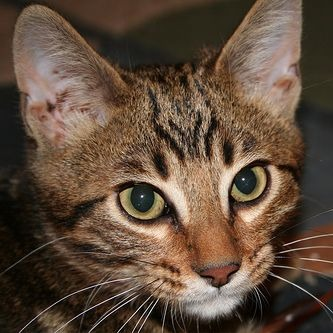

Format: JPEG.
Mode: RGB.
Height: 333.
Width: 333.


In [162]:
chat = Image.open("chat.jpg")
chat.show()
print(
    f"Format: {chat.format}.\nMode: {chat.mode}.\nHeight: {chat.height}.\nWidth: {chat.width}."
)

This is because the camera sensor's response to noise varies from one color channel to anoth.

jpeg,png,gif,bmp,tiff.

(333, 333, 3)


array([[[32, 28, 19],
        [32, 28, 19],
        [31, 26, 20],
        ...,
        [36, 34, 21],
        [36, 34, 21],
        [36, 34, 21]],

       [[34, 30, 21],
        [33, 29, 20],
        [33, 28, 22],
        ...,
        [37, 35, 22],
        [37, 35, 22],
        [37, 35, 22]],

       [[38, 31, 23],
        [37, 30, 22],
        [37, 30, 22],
        ...,
        [37, 35, 22],
        [37, 35, 22],
        [37, 35, 22]],

       ...,

       [[22, 19, 10],
        [24, 21, 12],
        [26, 23, 14],
        ...,
        [30, 34, 37],
        [31, 35, 38],
        [32, 36, 39]],

       [[22, 19, 10],
        [25, 22, 13],
        [26, 23, 14],
        ...,
        [32, 36, 39],
        [33, 37, 40],
        [33, 37, 40]],

       [[23, 20, 11],
        [25, 22, 13],
        [26, 23, 14],
        ...,
        [33, 37, 40],
        [34, 38, 41],
        [35, 39, 42]]], dtype=uint8)

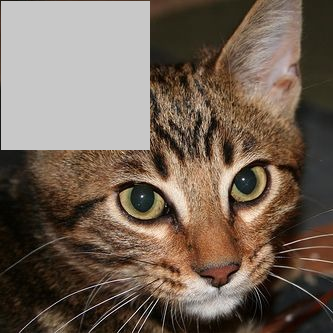

In [163]:
import numpy as np

image_array = np.asarray(chat)  # PIL --> ndarray
print(image_array.shape)
display(image_array)  # For debug / understanding the data
# DO SOMETHING
# Here I try to make a zone of the image become totally green
image_array = np.asarray(chat).copy()
image_array[1:150, 1:150] = (200, 200, 200)
image_result = Image.fromarray(image_array)
# ndarray --> PIL. You may have to add the mode argument here.
display(image_result)

In [164]:
def grayscale_conversion(image_array):
    gray_array = (
        0.30 * image_array[:, :, 0]
        + 0.59 * image_array[:, :, 1]
        + 0.11 * image_array[:, :, 2]
    ).astype(np.uint8)
    return gray_array

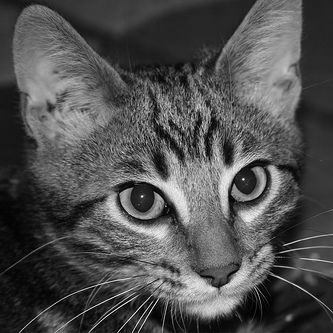

In [165]:
image_array = np.asarray(Image.open("chat.jpg"))
result = grayscale_conversion(image_array)
display(Image.fromarray(result))

*Ex2*

In [166]:
def counterclockwise(image_array):
    image_array_90d = image_array.swapaxes(0, 1)[::-1, :, :]
    return image_array_90d

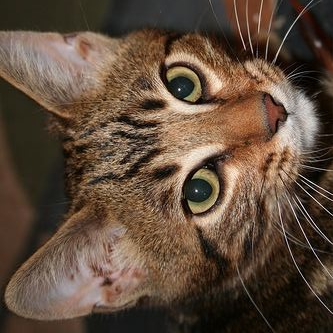

In [167]:
image_array = np.asarray(Image.open("chat.jpg"))
result = counterclockwise(image_array)
display(Image.fromarray(result))

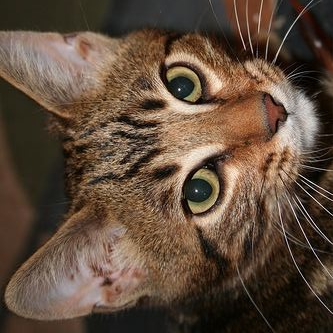

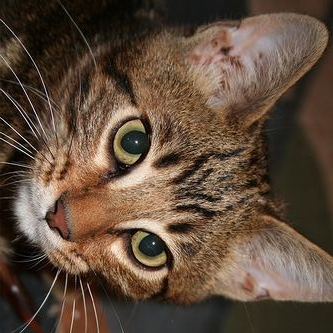

In [168]:
image_array = np.asarray(Image.open("chat.jpg"))
display(Image.fromarray(np.rot90(image_array, k=1, axes=(0, 1))))
display(Image.fromarray(np.rot90(image_array, k=3, axes=(0, 1))))

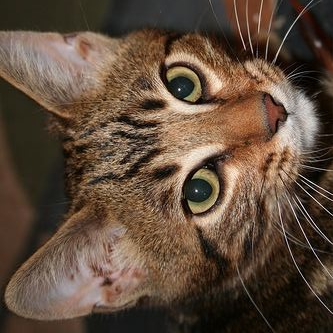

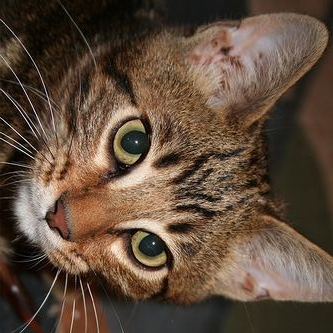

In [169]:
chat = Image.open("chat.jpg")
display(chat.rotate(90, expand=True))
display(chat.rotate(-90, expand=True))

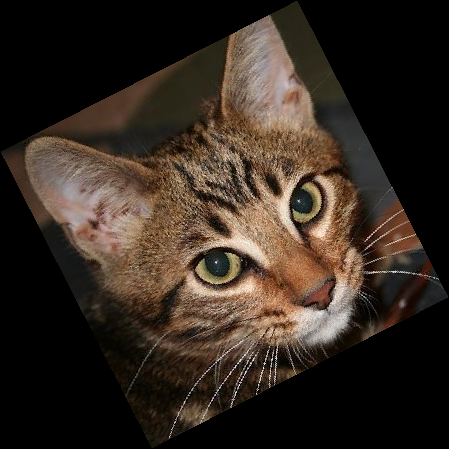

In [170]:
chat = Image.open("chat.jpg")
display(chat.rotate(27, expand=True))

The expand parameter controls whether the rotated image will be expanded to fit the new size. When expand=True is set, PIL automatically expands the image to fit the rotated size to ensure that no image information is lost. Otherwise it may result in part of the image being cropped out or leaving some blank areas after rotation.

*Ex3*

In [171]:
%pip install opencv-python
# sudo apt-get update
# sudo apt-get install libgl1-mesa-glx

Note: you may need to restart the kernel to use updated packages.


In [172]:
import cv2
image_8 = cv2.imread("S0230_CC_illum_8bits.png", cv2.IMREAD_UNCHANGED)
image_16 = cv2.imread("S0230_CC_illum_16bits.png", cv2.IMREAD_UNCHANGED)

In [173]:
def showCV2Image(image_array):
    display(Image.fromarray(cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB)))


def convert16to8(image_array):
    return np.uint8(image_array / 256)

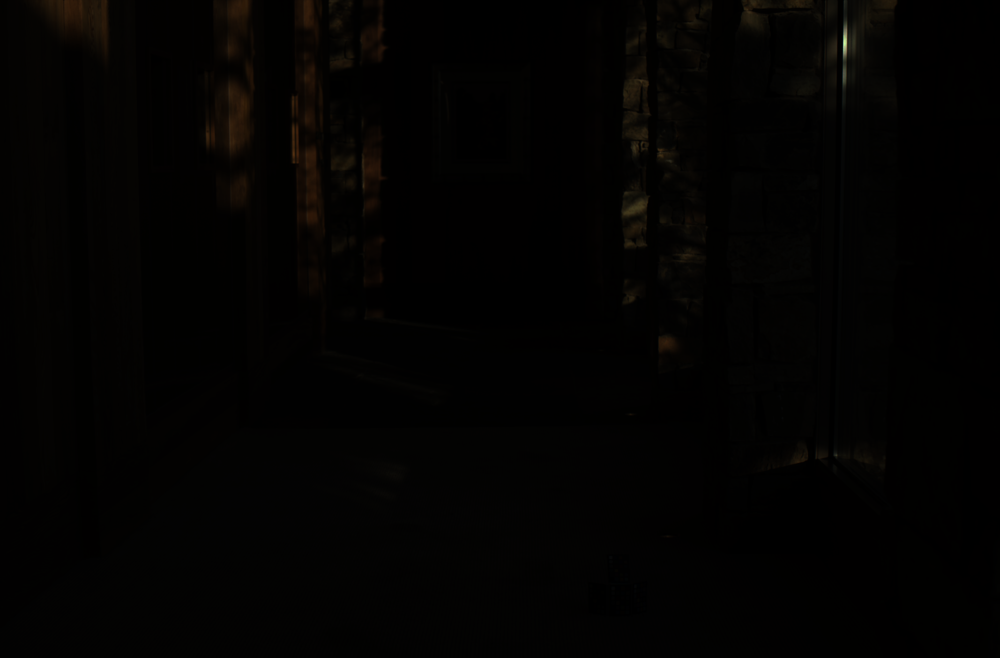

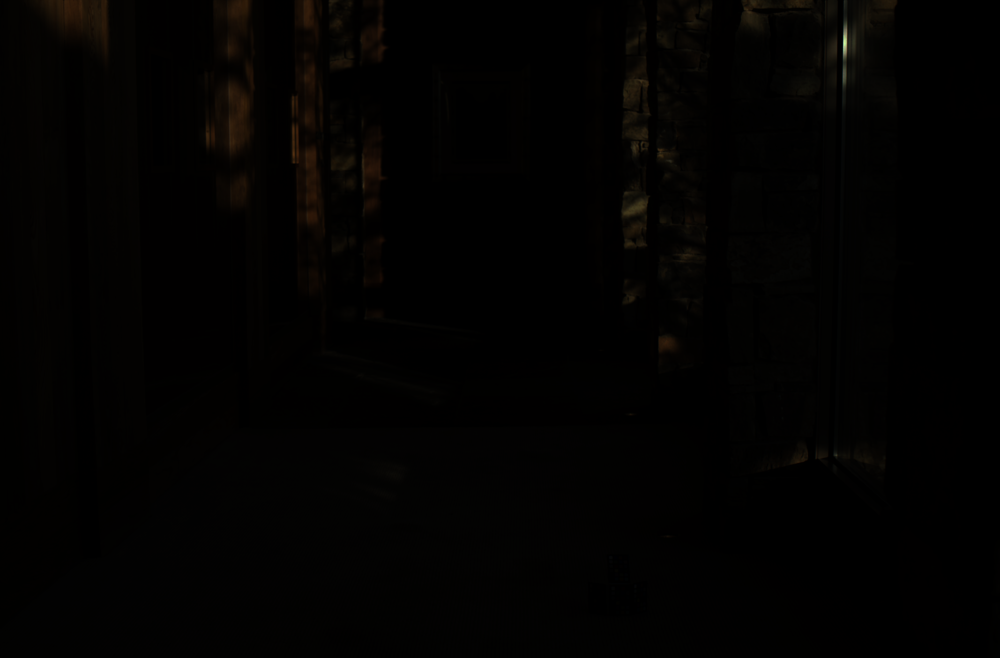

In [174]:
showCV2Image(image_8)
showCV2Image(convert16to8(image_16))

It's too dark that we can't see things.

In [175]:
min_8 = np.min(image_8)
max_8 = np.max(image_8)
min_16 = np.min(image_16)
max_16 = np.max(image_16)
print(
    f"Minimum of 8bit image is: {min_8}.\nMaximum of 8bit image is: {max_8}.\nMinimum of 16bit image is: {min_16}.\nMaximum of 16bit image is: {max_16}.\n"
)

Minimum of 8bit image is: 0.
Maximum of 8bit image is: 255.
Minimum of 16bit image is: 3.
Maximum of 16bit image is: 65535.



We can say that for 8bit images, the min is 0 and max is 255 because each pixel value is between 0 and 255. For 16bit images, the min is 3 and max is 65535, that means 16bit images is larger then 8bit images.

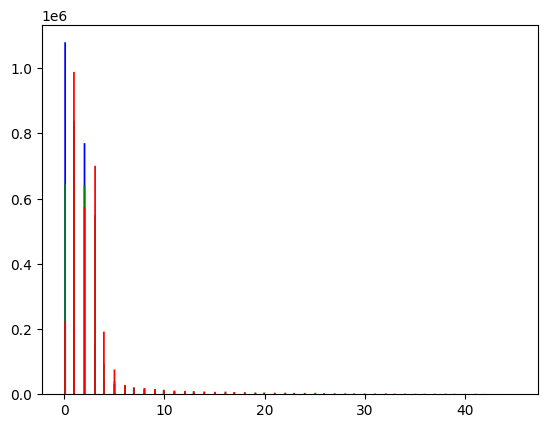

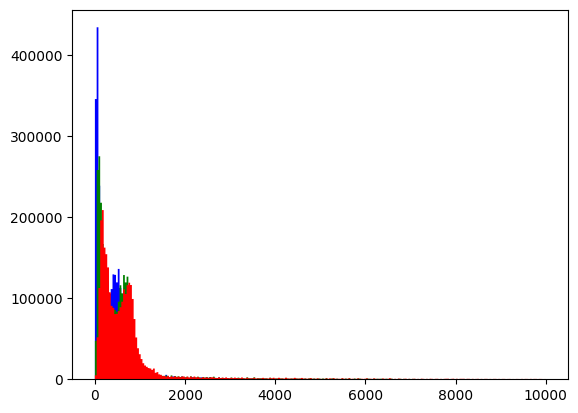

In [176]:
from matplotlib import pyplot as plt


def plotHist(image_array, histrange):
    for i, col in enumerate(("b", "g", "r")):
        plt.hist(
            image_array[:, :, i].ravel(),
            256,
            histrange,
            color=col,
            histtype="stepfilled",
        )
    plt.show()


plotHist(image_8, (0, 45))
plotHist(image_16, (0, 10000))

The two graphs show similar trends

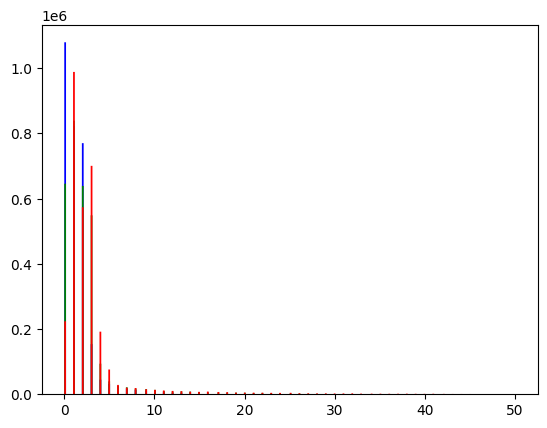

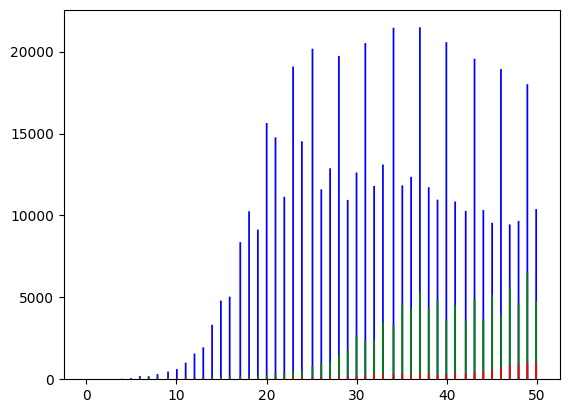

In [177]:
plotHist(image_8, (0, 50))
plotHist(image_16, (0, 50))

We can see that the 16bit image has more data and detail.

In [178]:
# image_8[:, :, :2] = image_8[:, :, :2] * 25.0
# image_16[:, :, :2] = image_16[:, :, :2] * 25.0
image_8[:, :, :2] = np.clip(image_8[:, :, :2] * 25.0, 0, 255).astype(np.uint8)
image_16[:, :, :2] = np.clip(image_16[:, :, :2] * 25.0, 0, 65535).astype(np.uint16)

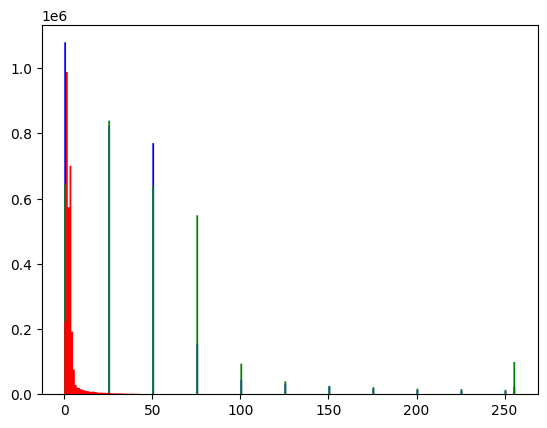

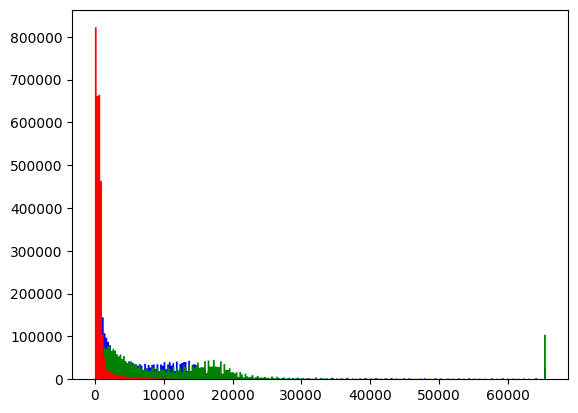

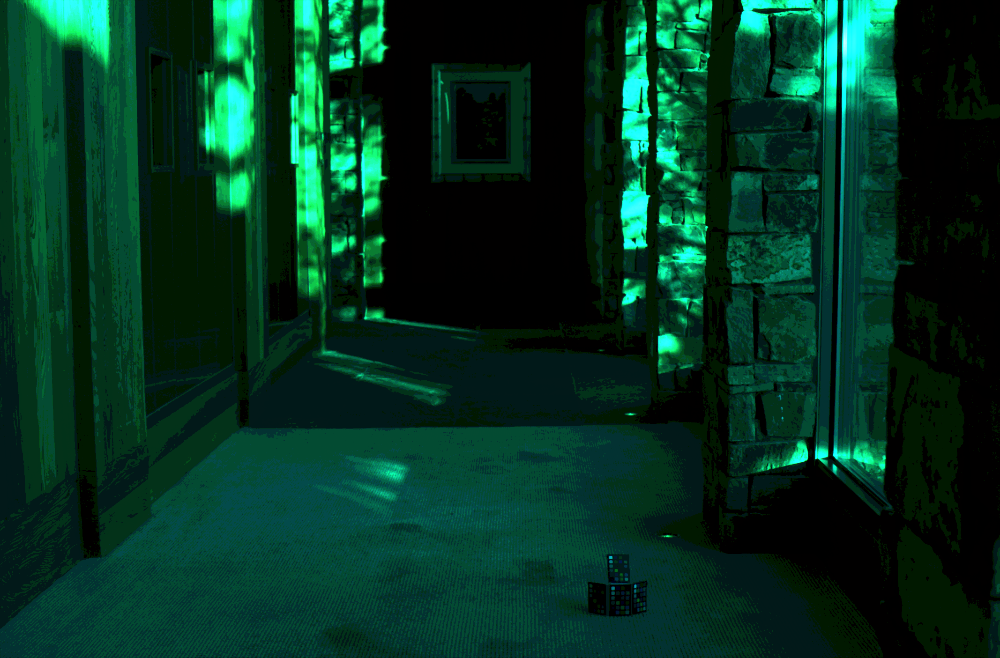

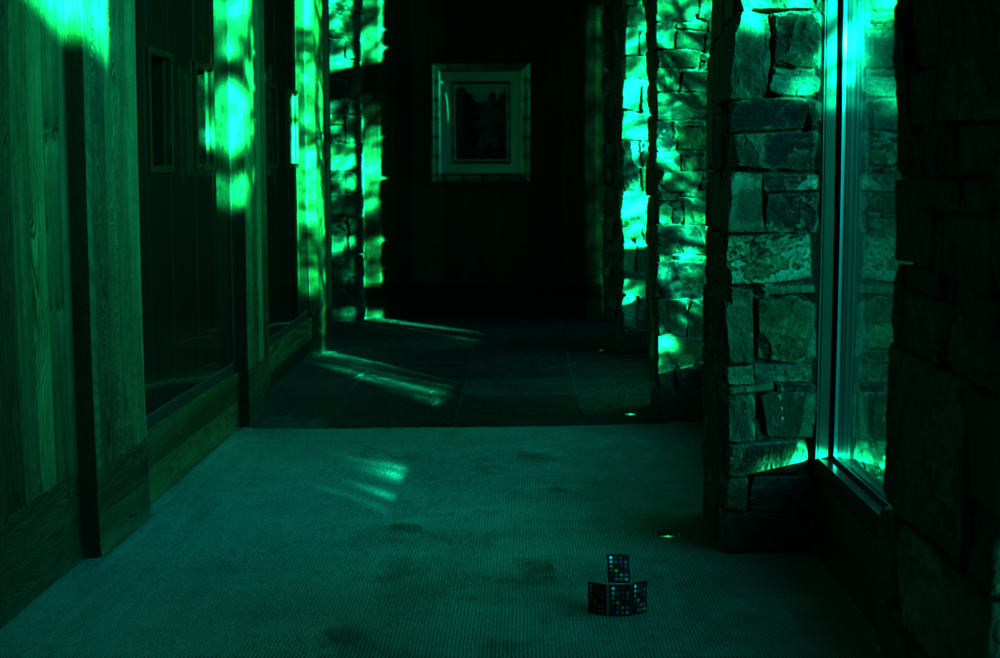

In [179]:
plotHist(image_8, (0, 256))
plotHist(image_16, (0, 65535))
showCV2Image(image_8)
showCV2Image(convert16to8(image_16))